## Importing necessary libraries

In [3]:
import os
from tqdm import tqdm

# Data Processing Libraries 

import pandas as pd 
import numpy as np 


# Feature Engineering Libraries

from sklearn.preprocessing import OneHotEncoder

# Data Visualisation libraries 
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

import cv2
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

SAMPLE_LEN=100

In [4]:

import warnings
warnings.filterwarnings("ignore")

## Image Augmentation 

# skimage
from skimage.io import imshow, imread, imsave
from skimage.transform import rotate, AffineTransform, warp,rescale, resize, downscale_local_mean
from skimage import color,data
from skimage.exposure import adjust_gamma
from skimage.util import random_noise


# 3D scatter plot
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors


#OpenCV-Python
import cv2

# imgaug
import imageio
import imgaug as ia
import imgaug.augmenters as iaa

# Albumentations
import albumentations as A


# Preparing the ground

In [5]:
train_image_path = '../input/plant-pathology-2021-fgvc8/train_images'
test_image_path = '../input/plant-pathology-2021-fgvc8/test_images'
train_df_path = '../input/plant-pathology-2021-fgvc8/train.csv'
test_df_path = '../input/plant-pathology-2021-fgvc8/sample_submission.csv'

In [6]:
df_train = pd.read_csv(train_df_path)

In [7]:
df_train.head()

,image,labels
0,800113bb65efe69e.jpg,healthy
1,8002cb321f8bfcdf.jpg,scab frog_eye_leaf_spot complex
2,80070f7fb5e2ccaa.jpg,scab
3,80077517781fb94f.jpg,scab
4,800cbf0ff87721f8.jpg,complex


In [8]:
df_train['labels'].value_counts()

scab                               4826
healthy                            4624
frog_eye_leaf_spot                 3181
rust                               1860
complex                            1602
powdery_mildew                     1184
scab frog_eye_leaf_spot             686
scab frog_eye_leaf_spot complex     200
frog_eye_leaf_spot complex          165
rust frog_eye_leaf_spot             120
rust complex                         97
powdery_mildew complex               87
Name: labels, dtype: int64

<AxesSubplot:xlabel='labels', ylabel='Count'>

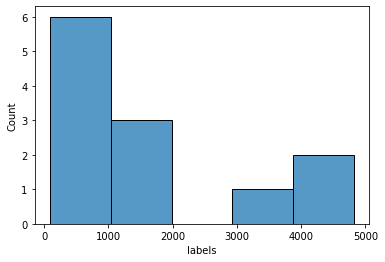

In [9]:
sns.histplot(df_train['labels'].value_counts(sort=True))

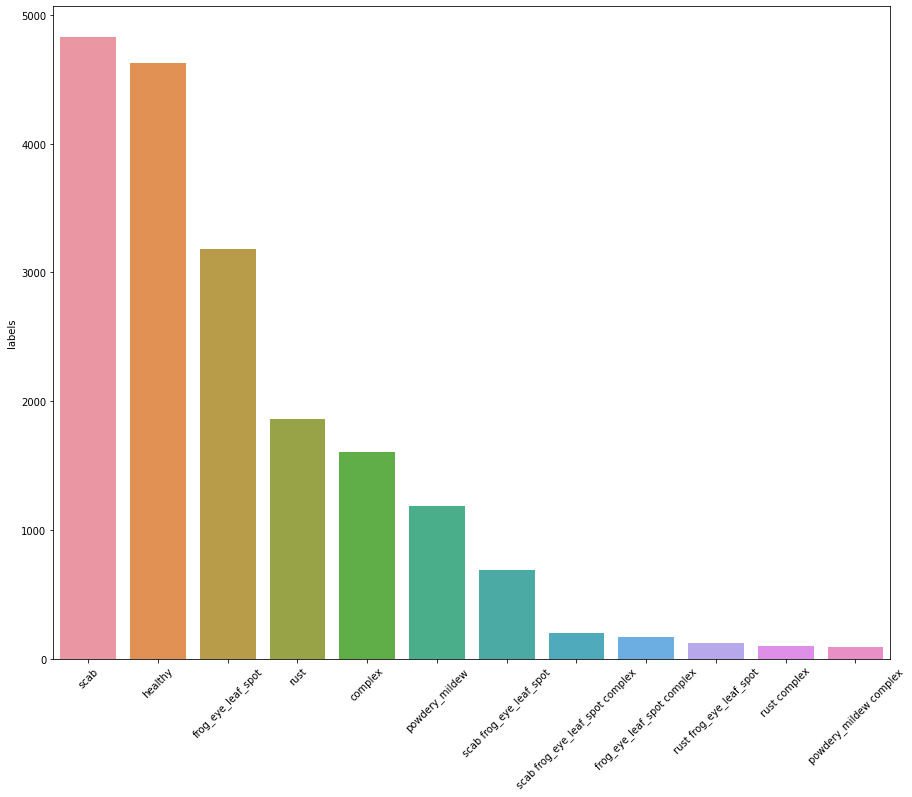

In [10]:
plt.figure(figsize=(15,12))
labels = sns.barplot(df_train.labels.value_counts().index,df_train.labels.value_counts())
for item in labels.get_xticklabels():
    item.set_rotation(45)

In [11]:
source = df_train['labels'].value_counts()

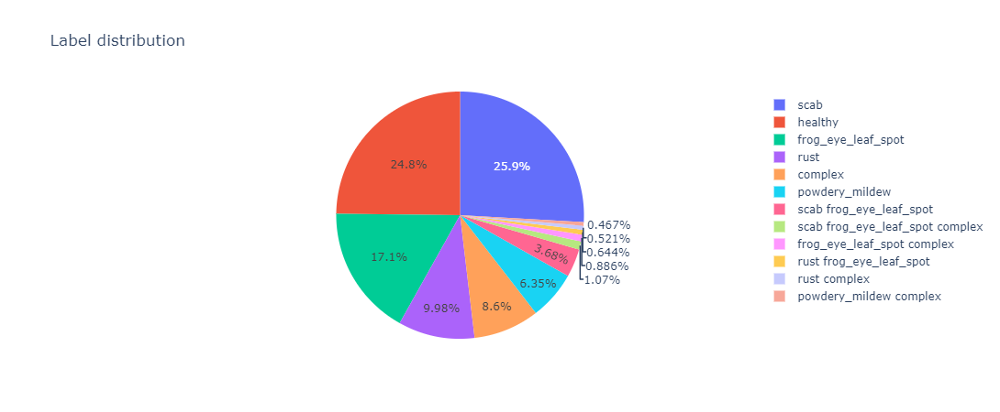

In [12]:
fig = go.Figure(data=[go.Pie(labels=source.index,values=source.values)])
fig.update_layout(title='Label distribution')
fig.show()

## Observation 

- Dataset is pretty unbalanced as per above pie chart 
- Need to chose the appropirate sampling strategy to sortout this issue 

# Let see the Plant pathology Images

In [13]:
def visualize_batch(path,image_ids, labels):
    plt.figure(figsize=(16, 12))
    
    for ind, (image_id, label) in enumerate(zip(image_ids, labels)):
        plt.subplot(3, 3, ind + 1)
        image = cv2.imread(os.path.join(path, image_id))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        plt.imshow(image)
        plt.title(f"Class: {label}", fontsize=12)
        plt.axis("off")
    plt.show()

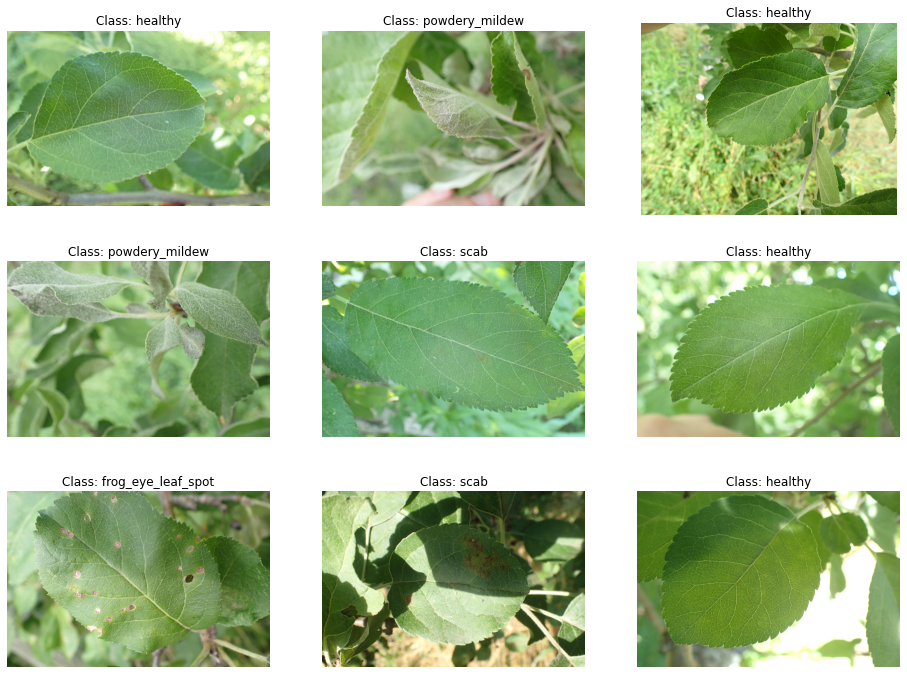

In [14]:
tmp_df = df_train.sample(9)
image_ids = tmp_df["image"].values
labels = tmp_df["labels"].values
visualize_batch(train_image_path,image_ids,labels)

 I have plotted the few images in the training data above (the RGB values can be seen by hovering over the image). The green parts of the image have very low blue values, but by contrast, the brown parts have high blue values. This suggests that green (healthy) parts of the image have low blue values, whereas unhealthy parts are more likely to have high blue values. **This might suggest that the blue channel may be the key to detecting diseases in plants.**

In [13]:
df_train

,image,labels
0,800113bb65efe69e.jpg,healthy
1,8002cb321f8bfcdf.jpg,scab frog_eye_leaf_spot complex
2,80070f7fb5e2ccaa.jpg,scab
3,80077517781fb94f.jpg,scab
4,800cbf0ff87721f8.jpg,complex
...,...,...
18627,fffb900a92289a33.jpg,healthy
18628,fffc488fa4c0e80c.jpg,scab
18629,fffc94e092a59086.jpg,rust
18630,fffe105cf6808292.jpg,scab frog_eye_leaf_spot


In [15]:
train_image_path

'../input/plant-pathology-2021-fgvc8/train_images'

In [16]:
def load_image(image_id):
    file_path = image_id
    image = cv2.imread(train_image_path+'/'+ file_path)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Just take 100 sample images with SAMPLE_LEN=100 for RBG Channel Analysis

train_images = df_train["image"][:SAMPLE_LEN].apply(load_image)

In [16]:
df_train['label_list'] = df_train['labels'].str.split(' ')

Distinct List of labels 



*     healthy
*     complex
*     rust
*     frog_eye_leaf_spot
*     powdery_mildew
*     scab

In [17]:
lbls = ['healthy','complex','rust','frog_eye_leaf_spot','powdery_mildew','scab']
for x in lbls:
    df_train[x]=0

In [18]:
def lbl_lgc(col,lbl_list):
    if col in lbl_list:
        res = 1 
    else:
        res = 0
    return res

In [19]:
lbls = ['healthy','complex','rust','frog_eye_leaf_spot','powdery_mildew','scab']

for x in lbls:
    df_train[x] = np.vectorize(lbl_lgc)(x,df_train['label_list'])

In [20]:
df_train

,image,labels,label_list,healthy,complex,rust,frog_eye_leaf_spot,powdery_mildew,scab
0,800113bb65efe69e.jpg,healthy,[healthy],1,0,0,0,0,0
1,8002cb321f8bfcdf.jpg,scab frog_eye_leaf_spot complex,"[scab, frog_eye_leaf_spot, complex]",0,1,0,1,0,1
2,80070f7fb5e2ccaa.jpg,scab,[scab],0,0,0,0,0,1
3,80077517781fb94f.jpg,scab,[scab],0,0,0,0,0,1
4,800cbf0ff87721f8.jpg,complex,[complex],0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...
18627,fffb900a92289a33.jpg,healthy,[healthy],1,0,0,0,0,0
18628,fffc488fa4c0e80c.jpg,scab,[scab],0,0,0,0,0,1
18629,fffc94e092a59086.jpg,rust,[rust],0,0,1,0,0,0
18630,fffe105cf6808292.jpg,scab frog_eye_leaf_spot,"[scab, frog_eye_leaf_spot]",0,0,0,1,0,1


In [17]:
df_train_lbl_onehot = pd.get_dummies(df_train, columns=["labels"], prefix=["LBL"])

In [18]:
df_train_lbl_onehot.columns

Index(['image', 'LBL_complex', 'LBL_frog_eye_leaf_spot',
       'LBL_frog_eye_leaf_spot complex', 'LBL_healthy', 'LBL_powdery_mildew',
       'LBL_powdery_mildew complex', 'LBL_rust', 'LBL_rust complex',
       'LBL_rust frog_eye_leaf_spot', 'LBL_scab',
       'LBL_scab frog_eye_leaf_spot', 'LBL_scab frog_eye_leaf_spot complex'],
      dtype='object')

### Observation :- 

In the above plot, we can see the relationship between all 6 categories. As expected, it is impossible for a healthy leaf  to have scab, rust, or multiple diseases. Also, every unhealthy leaf has one of either scab, rust, or multiple diseases. The frequency of each combination can be seen by hovering over the plot.

## Canny edge detection <a id="2.1"></a>

Canny is a popular edge detection algorithm, and as the name suggests, it detects the edges of objects present in an image. It was developed by John F. Canny in 1986. The algorithm involves several steps.

1. **Noise reduction:** Since edge detection is susceptible to noise in an image, we remove the noise in the image using a 5x5 Gaussian filter.


2. **Finding Intensity Gradient of the Image**: The smoothened image is then filtered with a Sobel kernel in both horizontal and vertical directions to get the first derivative in the horizontal (*G<sub>x</sub>*) and vertical (*G<sub>y</sub>*) directions. From these two images, one can find the edge gradient and direction for each pixel:

<center><img src="https://i.imgur.com/ntyjTep.png" width="300px"></center>
<center><img src="https://i.imgur.com/75qDjv6.png" width="260px"></center>

<br>

3. **Rounding:** The gradient is always perpendicular to edges. So, it is rounded to one of the four angles representing vertical, horizontal and two diagonal directions.

4. **Non-maximum suppression:** After getting the gradient magnitude and direction, a full scan of the image is done to remove any unwanted pixels which may not constitute the edge. For this, we check every pixel for being a local maximum in its neighborhood in the direction of the gradient.

5. **Hysteresis Thresholding:** This stage decides which parts are edges and which are not. For this, we need two threshold values, *minVal* and *maxVal*. Any edges with intensity gradient greater than *maxVal* are considered edges and those lesser than *minVal* are considered non-edges, and discarded. Those who lie between these two thresholds are classified edges or non-edges based on their neighborhood. If they are near “sure-edge” pixels, they are considered edges, and otherwise, they are discarded.

The result of these five steps is a two-dimensional binary map (0 or 255) indicating the location of edges on the image. Canny edge is demonstrated below with a few leaf images:

In [20]:
def edge_and_cut(img):
    emb_img = img.copy()
    edges = cv2.Canny(img, 100, 200)
    edge_coors = []
    for i in range(edges.shape[0]):
        for j in range(edges.shape[1]):
            if edges[i][j] != 0:
                edge_coors.append((i, j))
    
    row_min = edge_coors[np.argsort([coor[0] for coor in edge_coors])[0]][0]
    row_max = edge_coors[np.argsort([coor[0] for coor in edge_coors])[-1]][0]
    col_min = edge_coors[np.argsort([coor[1] for coor in edge_coors])[0]][1]
    col_max = edge_coors[np.argsort([coor[1] for coor in edge_coors])[-1]][1]
    new_img = img[row_min:row_max, col_min:col_max]
    
    emb_img[row_min-10:row_min+10, col_min:col_max] = [255, 0, 0]
    emb_img[row_max-10:row_max+10, col_min:col_max] = [255, 0, 0]
    emb_img[row_min:row_max, col_min-10:col_min+10] = [255, 0, 0]
    emb_img[row_min:row_max, col_max-10:col_max+10] = [255, 0, 0]
    
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(30, 20))
    ax[0].imshow(img, cmap='gray')
    ax[0].set_title('Original Image', fontsize=24)
    ax[1].imshow(edges, cmap='gray')
    ax[1].set_title('Canny Edges', fontsize=24)
    ax[2].imshow(emb_img, cmap='gray')
    ax[2].set_title('Bounding Box', fontsize=24)
    plt.show()

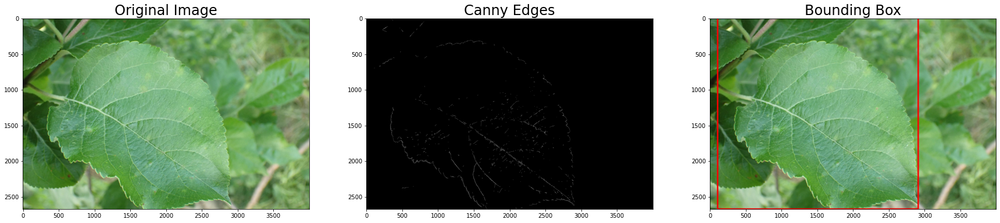

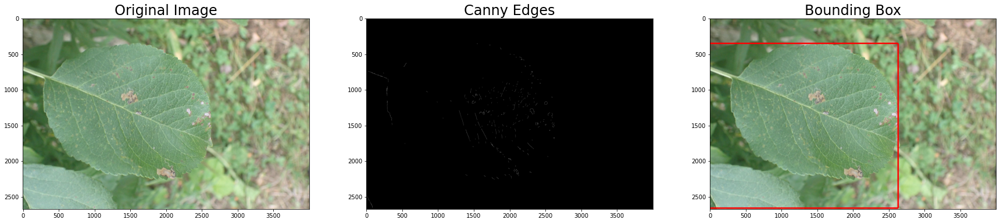

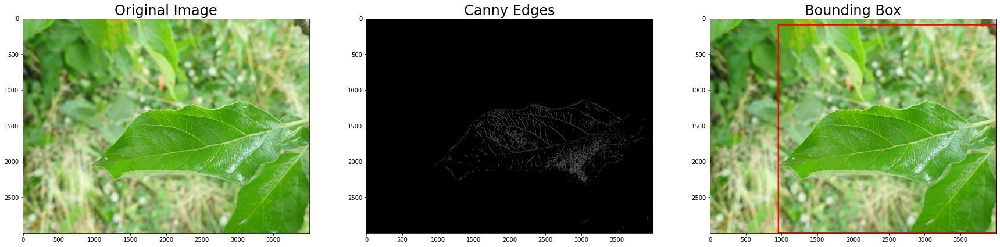

In [21]:
edge_and_cut(train_images[3])
edge_and_cut(train_images[4])
edge_and_cut(train_images[5])

### Observation :-

The second column of images above contains the Canny edges and the third column contains cropped images. I have taken the Canny edges and used it to predict a bounding box in which the actual leaf is contained. The most extreme edges at the four corners of the image are the vertices of the bounding box. This red box is likely to contain most of if not all of the leaf. These edges and bounding boxes can be used to build more accurate models.

## Flipping <a id="2.2"></a>

Flipping is a simple transformation that involves index-switching on the image channels. In vertical flipping, the order of rows is exchanged, whereas in vertical flipping, the order of rows is exchanged. Let us assume that *A<sub>ijk</sub>* (of size *(m, n, 3)*) is the image we want to flip. Horizontal and vertical flipping can be represented by the transformations below:

<center><img src="https://i.imgur.com/B9y5apl.png" width="135px"></center>
<center><img src="https://i.imgur.com/eQ1dyvN.png" width="305px"></center>
<center><img src="https://i.imgur.com/i30LQgq.png" width="305px"></center>
<br>

We can see that the order of columns is exchanged in horizontal flipping. While the *i* and *k* indices remain the same, the *j* index reverses. Whereas, in vertical flipping, the order of rows is exchanged in horizontal flipping. While the *j* and *k* indices remain the same, the *i* index reverses.



In [22]:
def invert(img):
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(30, 20))
    ax[0].imshow(img)
    ax[0].set_title('Original Image', fontsize=24)
    ax[1].imshow(cv2.flip(img, 0))
    ax[1].set_title('Vertical Flip', fontsize=24)
    ax[2].imshow(cv2.flip(img, 1))
    ax[2].set_title('Horizontal Flip', fontsize=24)
    plt.show()

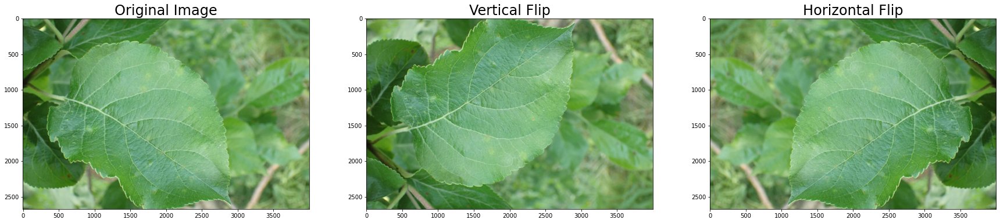

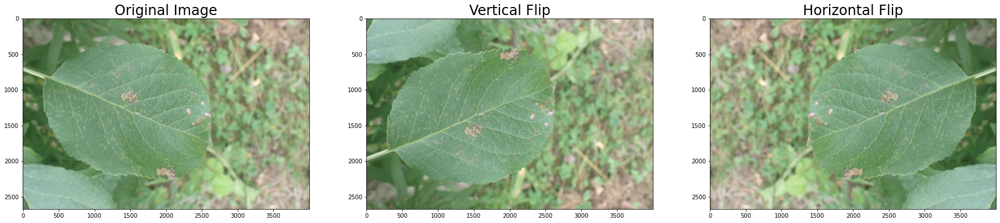

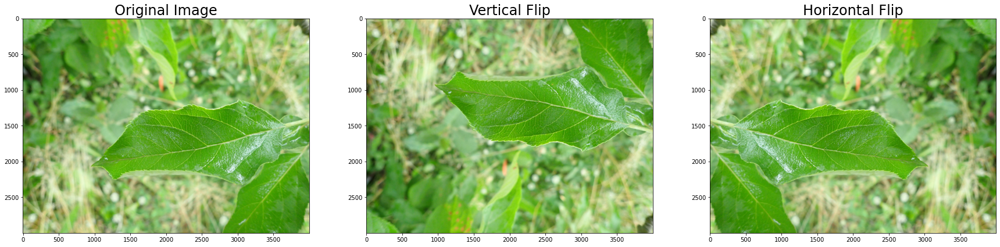

In [23]:
invert(train_images[3])
invert(train_images[4])
invert(train_images[5])

## Convolution <a id="2.3"></a>

Convolution is a rather simple algorithm which involves a kernel (a 2D matrix) which moves over the entire image, calculating dot products with each window along the way. The GIF below demonstrates convolution in action.

<center><img src="https://i.imgur.com/wYUaqR3.gif" width="450px"></center>

The above process can be summarized with an equation, where *f* is the image and *h* is the kernel. The dimensions of *f* are *(m, n)* and the kernel is a square matrix with dimensions smaller than *f*:

<center><img src="https://i.imgur.com/9scTOGv.png" width="350px"></center>
<br>

In the above equation, the kernel *h* is moving across the length and breadth of the image. The dot product of *h* with a sub-matrix or window of matrix *f* is taken at each step, hence the double summation (rows and columns). Below I demonstrate the effect of convolution on leaf images.

In [26]:
def conv(img):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 20))
    kernel = np.ones((7, 7), np.float32)/25
    conv = cv2.filter2D(img, -1, kernel)
    ax[0].imshow(img)
    ax[0].set_title('Original Image', fontsize=24)
    ax[1].imshow(conv)
    ax[1].set_title('Convolved Image', fontsize=24)
    plt.show()

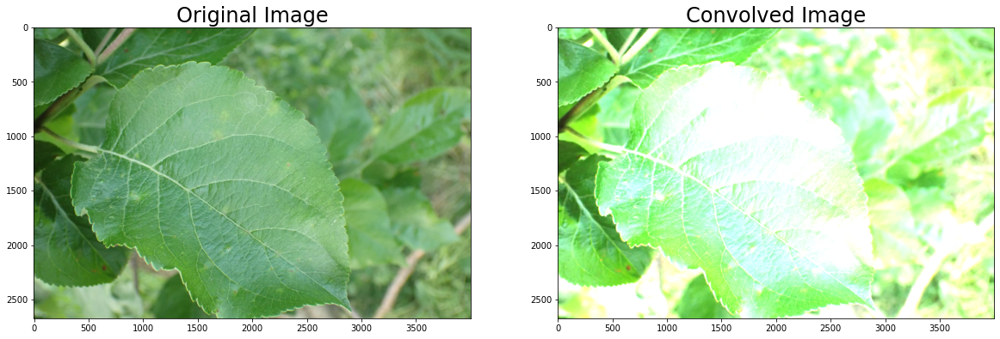

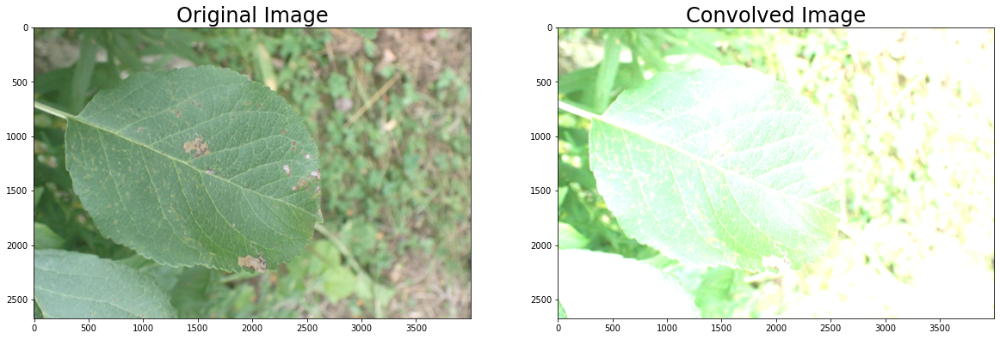

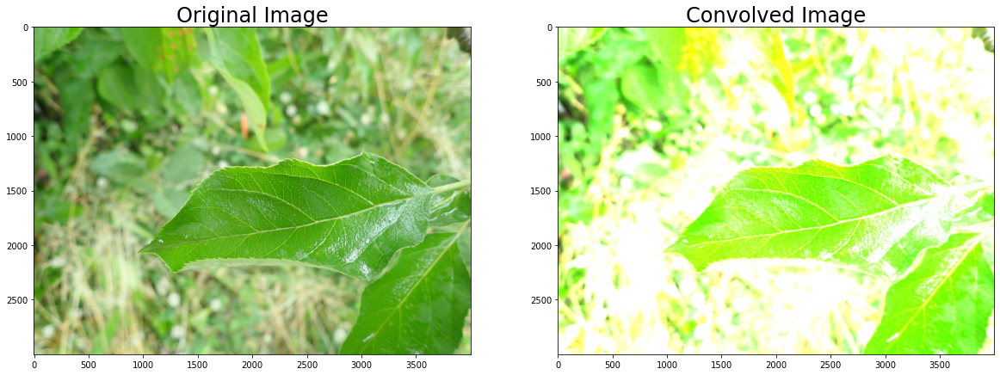

In [27]:
conv(train_images[3])
conv(train_images[4])
conv(train_images[5])

### Observation :- 

The convolution operator seems to have an apparent "sunshine" effect of the images. This may also serve the purpose of augmenting the data, thus helping to build more robust and accurate models. 

## Blurring <a id="2.4"></a>

Blurring is simply the addition of noise to the image, resulting in a less-clear image. The noise can be sampled from any distribution of choice, as long as the main content in the image does not become invisible. Only the minor details get obfuscated due to blurring. The blurring transformation can be represented using the equation below. 

<center><img src="https://i.imgur.com/zVM8HCU.png" width="220px"></center>
<br>

The example uses a Gaussian distribution with mean 0 and variance 0.1. Below I demonstrate the effect of blurring on a few leaf images:

In [29]:
def blur(img):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 20))
    ax[0].imshow(img)
    ax[0].set_title('Original Image', fontsize=24)
    ax[1].imshow(cv2.blur(img, (100, 100)))
    ax[1].set_title('Blurred Image', fontsize=24)
    plt.show()

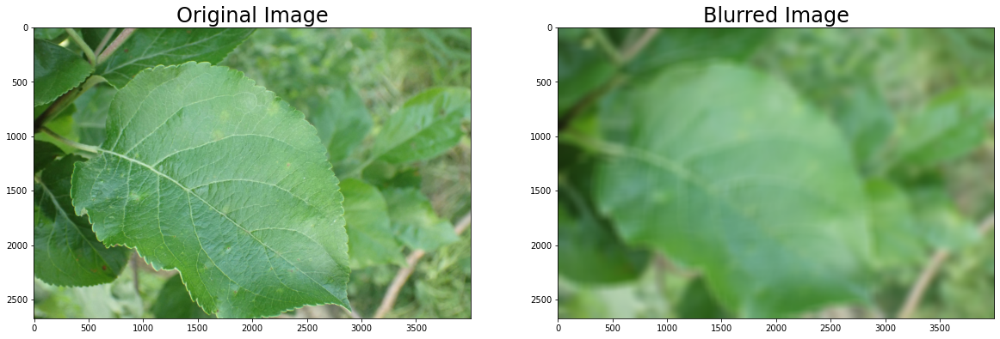

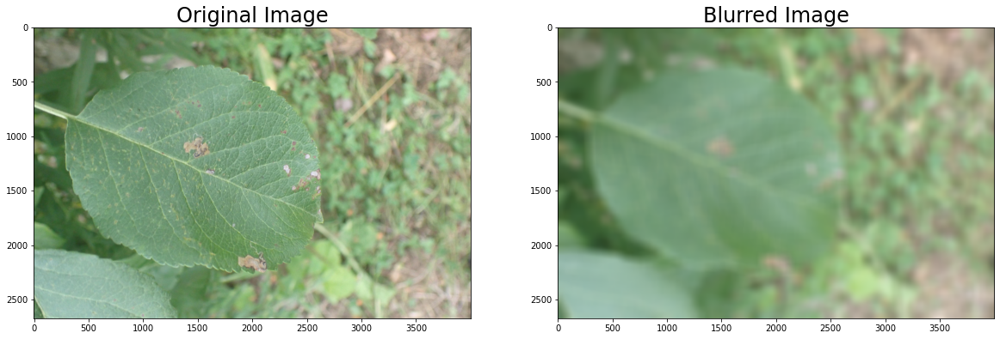

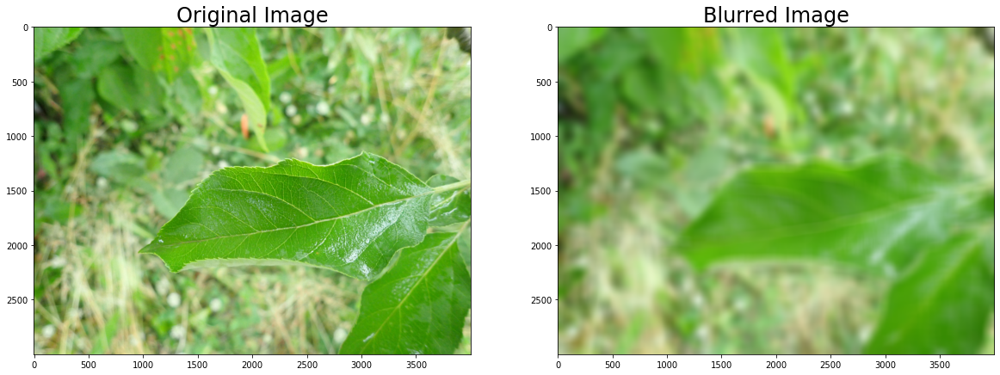

In [30]:
blur(train_images[3])
blur(train_images[4])
blur(train_images[5])

##  2.5 Rotation with skimage <a id="2.5"></a>

(2672, 4000, 3)


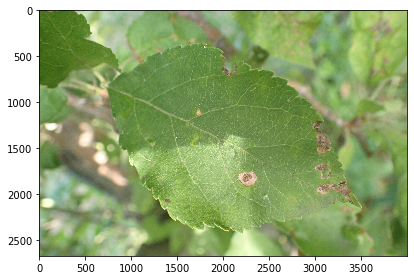

In [31]:
image = train_images[10]
imshow(image)
print(image.shape)

In [32]:
# clockwise rotation
rot_clockwise_image = rotate(image, angle=45) 
# Anticlockwise rotation
rot_anticlockwise_image = rotate(image, angle=-45)

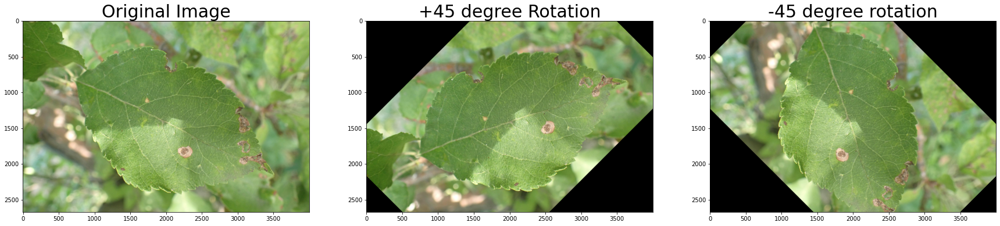

In [33]:
fig,ax = plt.subplots(nrows=1,ncols=3,figsize=(30,16))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=30)
ax[1].imshow(rot_clockwise_image)
ax[1].set_title("+45 degree Rotation", size=30)
ax[2].imshow(rot_anticlockwise_image)
ax[2].set_title("-45 degree rotation", size=30);

##  2.6 Cropping with skimage <a id="2.6"></a>

In [34]:
# source: https://www.kaggle.com/safavieh/image-augmentation-using-skimage
import random
import pylab as pl 
def randRange(a, b):
    '''
    a utility function to generate random float values in desired range
    '''
    return pl.rand() * (b - a) + a
def randomCrop(im):
    '''
    croping the image in the center from a random margin from the borders
    '''
    margin = 1/3.5
    start = [int(randRange(0, im.shape[0] * margin)),
             int(randRange(0, im.shape[1] * margin))]
    end = [int(randRange(im.shape[0] * (1-margin), im.shape[0])), 
           int(randRange(im.shape[1] * (1-margin), im.shape[1]))]
    cropped_image = (im[start[0]:end[0], start[1]:end[1]])
    return cropped_image

Text(0.5, 1.0, 'Cropped')

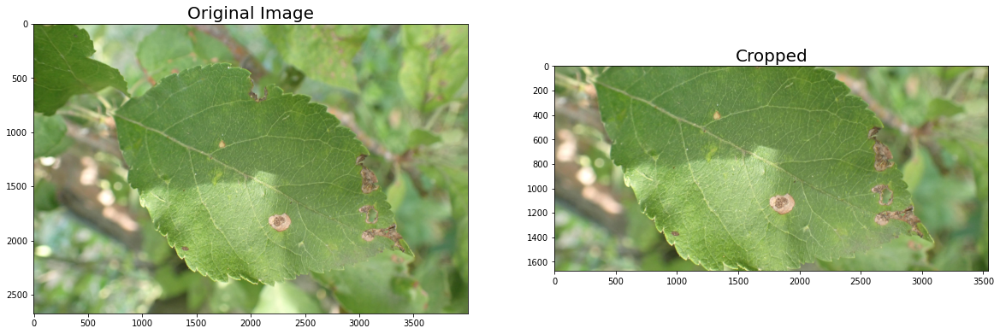

In [35]:
fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(20,12))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=20)
ax[1].imshow(randomCrop(image))
ax[1].set_title("Cropped", size=20)

##  2.7 Brightness Manipulation <a id="2.7"></a>

Text(0.5, 1.0, 'Darkened Image')

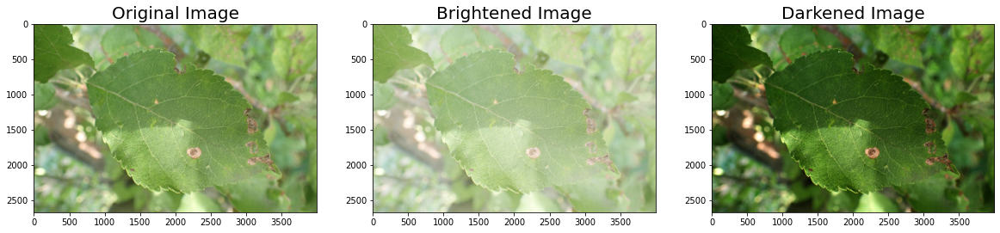

In [36]:
image_bright = adjust_gamma(image, gamma=0.5,gain=1)
image_dark = adjust_gamma(image, gamma=2,gain=1)


fig,ax = plt.subplots(nrows=1,ncols=3,figsize=(20,12))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=20)
ax[1].imshow(image_bright)
ax[1].set_title("Brightened Image", size=20)
ax[2].imshow(image_dark)
ax[2].set_title("Darkened Image", size=20)


In [35]:
import tensorflow as tf
def seed_everything():
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1' 
    np.random.seed(hash("improves reproducibility") % 2**32 - 1)
    tf.random.set_seed(hash("by removing stochasticity") % 2**32 - 1)
    
seed_everything()

In [38]:
TRAIN_PATH='/kaggle/input/plant-pathology-2021-fgvc8/train_images'
AUTOTUNE = tf.data.experimental.AUTOTUNE

CONFIG = dict (
    num_labels = 6,
    train_val_split = 0.2,
    img_width = 224,
    img_height = 224,
    batch_size = 32,
    epochs = 10,
    learning_rate = 0.001,
    architecture = "CNN",
    infra = "Kaggle",
    competition = 'plant-pathology',
    #_wandb_kernel = 'ayut'
)

In [39]:
# Encode competition-provided labels 
label_to_id = {
    'healthy': 0,
    'scab': 1,
    'frog_eye_leaf_spot': 2,
    'rust': 3,
    'complex': 4,
    'powdery_mildew': 5
}

id_to_label = {value:key for key, value in label_to_id.items()} 

# Helper fu
def make_path(row):
    return TRAIN_PATH+'/'+row.image

def parse_labels(row):
    label_list = row.labels.split()
    labels = []
    for label in label_list:
        labels.append(str(label_to_id[label]))
    
    return ' '.join(labels)

# Read train.csv file
df = pd.read_csv('../input/plant-pathology-2021-fgvc8/train.csv')
# Get absolute path
df['image'] = df.apply(lambda row: make_path(row), axis=1)
# Parse labels
df['labels'] = df.apply(lambda row: parse_labels(row), axis=1)

# Look at the dataframe
df.head()

,image,labels
0,/kaggle/input/plant-pathology-2021-fgvc8/train...,0
1,/kaggle/input/plant-pathology-2021-fgvc8/train...,1 2 4
2,/kaggle/input/plant-pathology-2021-fgvc8/train...,1
3,/kaggle/input/plant-pathology-2021-fgvc8/train...,1
4,/kaggle/input/plant-pathology-2021-fgvc8/train...,4


In [40]:
from sklearn.model_selection import train_test_split

# 5. Training and validation split

train_df, valid_df = train_test_split(df, test_size=CONFIG['train_val_split'])
print(f'Number of train images: {len(train_df)} and validation images: {len(valid_df)}')

Number of train images: 14905 and validation images: 3727


In [99]:
@tf.function
def decode_image(image):
    # Convert the compressed string to a 3D uint8 tensor
    image = tf.image.decode_jpeg(image, channels=3)
    
    # Normalize image
    image = tf.image.convert_image_dtype(image, dtype=tf.float32)
    
    # Resize the image to the desired size
    return image





In [42]:
# import tensorflow as tf

# @tf.function
# def data_augmentation(image):
#     # Flipping (horizontal and vertical)
#     if tf.random.uniform(()) > 0.5:
#         image = tf.image.flip_left_right(image)  # Flip horizontal
#     if tf.random.uniform(()) > 0.5:
#         image = tf.image.flip_up_down(image)  # Flip vertical

#     # Blurring (applying a Gaussian blur)
#     image = tf.image.random_gaussian_noise(image, stddev=0.2)  # Adjust the stddev as needed

#     # Rotation (clockwise rotation by a random angle)
#     angle = tf.random.uniform((), minval=-45, maxval=45)  # Adjust the range as needed
#     image = tf.image.rot90(image, k=tf.cast((angle / 90), dtype=tf.int32))

#     # Cropping (random cropping)
#     margin = 1/3.5
#     image_shape = tf.shape(image)
#     start_x = tf.cast(tf.random.uniform(()) * tf.cast(image_shape[1], tf.float32) * margin, tf.int32)
#     start_y = tf.cast(tf.random.uniform(()) * tf.cast(image_shape[0], tf.float32) * margin, tf.int32)
#     end_x = tf.cast(image_shape[1] * (1 - margin), tf.int32)
#     end_y = tf.cast(image_shape[0] * (1 - margin), tf.int32)
#     image = image[start_y:end_y, start_x:end_x, :]

#     # Brightness adjustment (gamma adjustment)
#     gamma = tf.random.uniform((), minval=0.5, maxval=2.0)  # Adjust the range as needed
#     image = tf.image.adjust_gamma(image, gamma=gamma, gain=1.0)

#     return image


In [145]:
import tensorflow as tf
import cv2
import numpy as np
import tensorflow_addons as tfa  # Import TensorFlow Addons


def data_augment(image, label=None):
    # Retournement aléatoire horizontal
    image = tf.image.random_flip_left_right(image)
    
    # Retournement aléatoire vertical
    image = tf.image.random_flip_up_down(image)
    
    # Rotation aléatoire
    rotation_angle = tf.random.uniform(shape=[], minval=-45, maxval=45)  # Ajustez l'angle de rotation selon vos besoins
    image = tfa.image.rotate(image, rotation_angle)
    
    # Manipulation de la luminosité
    brightness_factor = tf.random.uniform(shape=[], minval=0.3, maxval=0.5)  # Ajustez les valeurs min et max selon vos besoins
    image = tf.image.adjust_brightness(image, brightness_factor)
    
    # Add darkness effect with a certain probability
    if tf.random.uniform([]) < 0.2:  # Adjust the probability as needed
        # Adjust the darkness effect using gamma values
        gamma = tf.random.uniform(shape=[], minval=1.0, maxval=2.5)  # Adjust the range as needed
        image = tf.image.adjust_gamma(image, gamma, gain=1.0)
        
    
    if label is None:
        return image
    else:
        return image, label

# import tensorflow as tf
# import cv2
# import numpy as np
# import tensorflow_addons as tfa  # Import TensorFlow Addons

# def data_augment(image, label=None):
#     # Random horizontal flip
#     image = tf.image.random_flip_left_right(image)
    
#     # Random vertical flip
#     image = tf.image.random_flip_up_down(image)
    
#     # Random rotation
#     rotation_angle = tf.random.uniform(shape=[], minval=-30, maxval=30)
#     image = tfa.image.rotate(image, rotation_angle)
    
#     # Adjust brightness
#     brightness_factor = tf.random.uniform(shape=[], minval=0.5, maxval=1.5)
#     image = tf.image.adjust_brightness(image, brightness_factor)
    
#     if label is None:
#         return image
#     else:
#         return image, label



In [133]:
# "2"
# import tensorflow as tf
# import tensorflow_addons as tfa

# def data_augment(image, label=None):
#     print("Input image shape:", image.shape)
    
#     # Resize the image to fixed dimensions
#     image = tf.image.resize(image, (image_height, image_width))
#     print("After resizing shape:", image.shape)
    
#     # Random horizontal flip
#     image = tf.image.random_flip_left_right(image)
#     print("After horizontal flip shape:", image.shape)
    
#     # Random vertical flip
#     image = tf.image.random_flip_up_down(image)
#     print("After vertical flip shape:", image.shape)
    
#     # Random rotation
#     rotation_angle = tf.random.uniform(shape=[], minval=-45, maxval=45)
#     image = tfa.image.rotate(image, rotation_angle)
#     print("After rotation shape:", image.shape)
    
#     # Manipulation de la luminosité
#     brightness_factor = tf.random.uniform(shape=[], minval=0.3, maxval=0.5)
#     image = tf.image.adjust_brightness(image, brightness_factor)
#     print("After brightness adjustment shape:", image.shape)
    
# #     # Add darkness effect with a certain probability
# #     if tf.random.uniform([]) < 0.2:  # Adjust the probability as needed
# #         # Adjust the darkness effect using gamma values
# #         gamma = tf.random.uniform(shape=[], minval=1.5, maxval=2.5)  # Adjust the range as needed
# #         # Apply the gamma adjustment
# #         image = tf.image.adjust_gamma(image, gamma, gain=1.0)
# #         print("After gamma adjustment shape:", image.shape)
    
#     if label is None:
#         return image
#     else:
#         return image, label



In [147]:
@tf.function
def load_image(df_dict, data_augmentation=True):
    # Load image
    image = tf.io.read_file(df_dict['image'])
    image = decode_image(image)
    
    if data_augmentation:
        # Apply data augmentation using data_augment function
        image = data_augment(image)

    # Resize image
    image = tf.image.resize(image, (CONFIG['img_height'], CONFIG['img_width']))
    
    # Parse label
    label = tf.strings.split(df_dict['labels'], sep='')
    label = tf.strings.to_number(label, out_type=tf.int32)
    label = tf.reduce_sum(tf.one_hot(indices=label, depth=CONFIG['num_labels']), axis=0)
    
    return image, label





In [148]:

AUTOTUNE = tf.data.AUTOTUNE

trainloader = tf.data.Dataset.from_tensor_slices(dict(train_df))
validloader = tf.data.Dataset.from_tensor_slices(dict(valid_df))

# Définissez une fonction pour appliquer l'augmentation des données en utilisant map
def load_train_image(x):
    return load_image(x, data_augmentation=True)

def load_valid_image(x):
    return load_image(x, data_augmentation=False)

trainloader = (
    trainloader
    .shuffle(1024)
    .map(load_train_image, num_parallel_calls=AUTOTUNE)
    .batch(CONFIG['batch_size'])
    .prefetch(AUTOTUNE)
)

validloader = (
    validloader
    .map(load_valid_image, num_parallel_calls=AUTOTUNE)
    .batch(CONFIG['batch_size'])
    .prefetch(AUTOTUNE)
)


InvalidArgumentError: slice index 16 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/

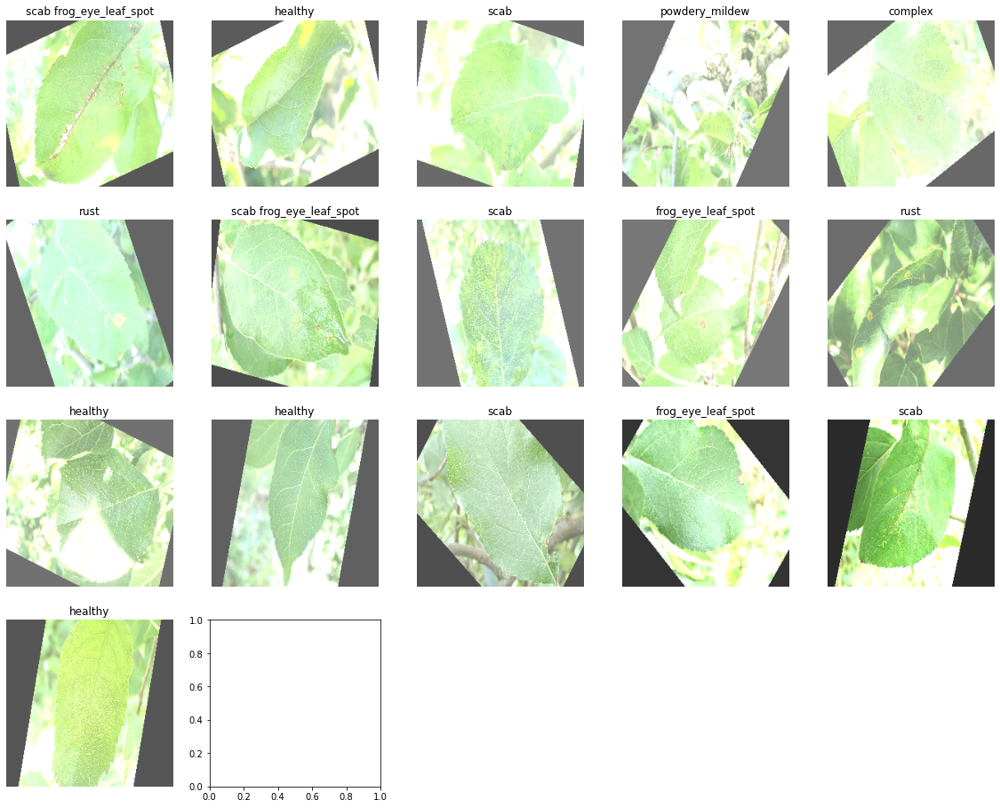

In [156]:
import matplotlib.pyplot as plt

# ...

# Data loader sanity check
def show_batch(data_loader):
    image_batch, label_batch = next(iter(data_loader))
    plt.figure(figsize=(20, 20))
    for n in range(25):
        ax = plt.subplot(5, 5, n + 1)
        plt.imshow(image_batch[n].numpy())
        label_values = label_batch[n].numpy()
        
        # Vérifiez la longueur des étiquettes avant d'accéder à leurs indices
        if len(label_values) > 0:
            label_indices = [i for i, label in enumerate(label_values) if label == 1.]
            labels = [id_to_label[i] for i in label_indices]
            plt.title(' '.join(labels))
        else:
            plt.title('No Label')
        plt.axis('off')

show_batch(trainloader)  # Affiche un échantillon de lot du DataLoader d'entraînement



In [151]:
import tensorflow as tf
print(tf.__version__)
from tensorflow.keras import layers
from tensorflow.keras import models
import tensorflow_addons as tfa

2.4.1


In [153]:
# 8. Define model: EfficientNetB0 trained on ImageNet as backbone
def get_model():
    base_model = tf.keras.applications.EfficientNetB0(include_top=False, weights='imagenet')
    base_model.trainabe = True
    inputs = layers.Input((CONFIG['img_height'], CONFIG['img_width'], 3))
    x = base_model(inputs, training=True)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(len(label_to_id), activation='sigmoid')(x)
    
    return models.Model(inputs, outputs)

# Model sanity check
tf.keras.backend.clear_session()
model = get_model()
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
efficientnetb0 (Functional)  (None, None, None, 1280)  4049571   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
dropout (Dropout)            (None, 1280)              0         
_________________________________________________________________
dense (Dense)                (None, 6)                 7686      
Total params: 4,057,257
Trainable params: 4,015,234
Non-trainable params: 42,023
_________________________________________________________________


In [154]:
# Initialize model
tf.keras.backend.clear_session()
model = get_model()

# Compile model
optimizer = tf.keras.optimizers.Adam(learning_rate=CONFIG['learning_rate'])
model.compile(optimizer,
              loss=tfa.losses.SigmoidFocalCrossEntropy(),
              metrics=[
                  tf.keras.metrics.AUC(multi_label=True),
                  tfa.metrics.F1Score(num_classes=6, average='micro'),
                  'accuracy'
              ])

In [155]:
CONFIG = {
    'num_labels': 6,
    'train_val_split': 0.2,
    'img_width': 224,
    'img_height': 224,
    'batch_size': 64,
    'epochs': 10,
    'learning_rate': 0.001,
    'architecture': 'CNN',
    'infra': 'Kaggle',
    'competition': 'plant-pathology',
    'model_name': 'efficientnetb0'
}

CONFIG['model_name'] = 'efficientnetb0'
print('Training configuration: ', CONFIG)

Training configuration:  {'num_labels': 6, 'train_val_split': 0.2, 'img_width': 224, 'img_height': 224, 'batch_size': 64, 'epochs': 10, 'learning_rate': 0.001, 'architecture': 'CNN', 'infra': 'Kaggle', 'competition': 'plant-pathology', 'model_name': 'efficientnetb0'}


In [ ]:
earlystopper = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=3, verbose=0, mode='min',
    restore_best_weights=True
)

# Train
model.fit(trainloader, 
          epochs=CONFIG['epochs'],
          validation_data=validloader,
          callbacks=[earlystopper])

Epoch 1/10
932/932 [==============================] - 9184s 10s/step - loss: 0.1955 - auc: 0.8604 - f1_score: 0.6346 - accuracy: 0.6329 - val_loss: 0.1120 - val_auc: 0.9601 - val_f1_score: 0.8033 - val_accuracy: 0.7998
Epoch 2/10
211/932 [=====>........................] - ETA: 1:54:06 - loss: 0.1110 - auc: 0.9575 - f1_score: 0.8137 - accuracy: 0.8122

# Ending note <a id="5"></a>

<font color="red" size=4>This concludes my kernel. Please upvote if you like it. It motivates me to produce more quality content :)</font>